# Chapter 4: Discrete Cosine / Wavelet Transform and Deconvolution

## 1. Template matching with Phase-Correlation in Frequency Domain


In [1]:
get_ipython().run_line_magic('matplotlib', 'inline') # 이게 뭘까
import scipy.fftpack as fp
from skimage.io import imread
from skimage.color import rgb2gray, gray2rgb
from skimage.draw import rectangle_perimeter
import numpy as np
import matplotlib.pylab as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import cv2

In [2]:
def plot_3d(X, Y, Z, cmap=plt.cm.seismic):
    fig = plt.figure(figsize=(20,20))
    ax = fig.gca(projection='3d')
    # Plot the surface.
    surf = ax.plot_surface(X, Y, Z, cmap=cmap, linewidth=5, antialiased=False)
    #ax.plot_wireframe(X, Y, Z, rstride=10, cstride=10)
    #ax.set_zscale("log", nonposx='clip')
    #ax.zaxis.set_scale('log')
    ax.zaxis.set_major_locator(LinearLocator(10))
    ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    ax.set_xlabel('F1', size=30)
    ax.set_ylabel('F2', size=30)
    ax.set_zlabel('Freq Response', size=30)
    #ax.set_zlim((-40,10))
    # Add a color bar which maps values to colors.
    fig.colorbar(surf) #, shrink=0.15, aspect=10)
    #plt.title('Frequency Response of the Gaussian Kernel')
    plt.show()    

In [4]:
im = 255*rgb2gray(imread('images/Chapter 04/images/Img_04_01.jpg'))
im_tm = 255*rgb2gray(imread('images/Chapter 04/images/Img_04_02.png'))

F = fp.fftn(im)
F_tm = fp.fftn(im_tm, shape=im.shape)

F_cc = F * np.conj(F_tm)
c = (fp.ifftn(F_cc/np.abs(F_cc))).real
i, j = np.unravel_index(c.argmax(), c.shape)
print(i, j)

im2 = (gray2rgb(im)).astype(np.uint8)
rr, cc = rectangle_perimeter((i,j), end=(i + im_tm.shape[0], j + im_tm.shape[1]), shape=im.shape)
for x in range(-2,2):
    for y in range(-2,2):
        im2[rr + x, cc + y] = (255,0,0)

52 174


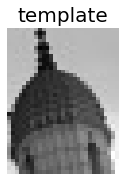

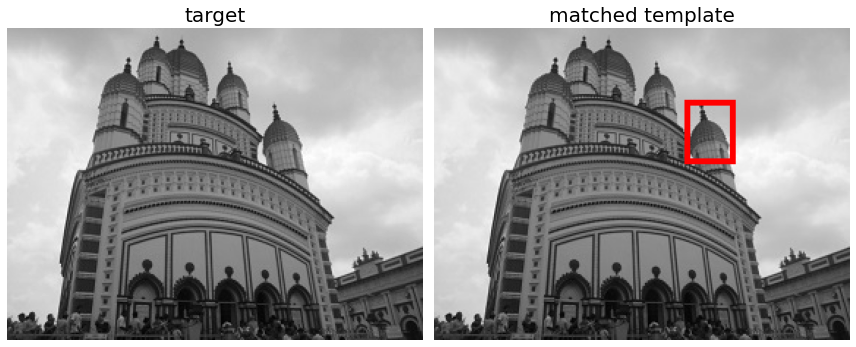

/var/folders/9v/jr20lh896vggl5_25dthcsw80000gn/T/ipykernel_15933/440300303.py:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


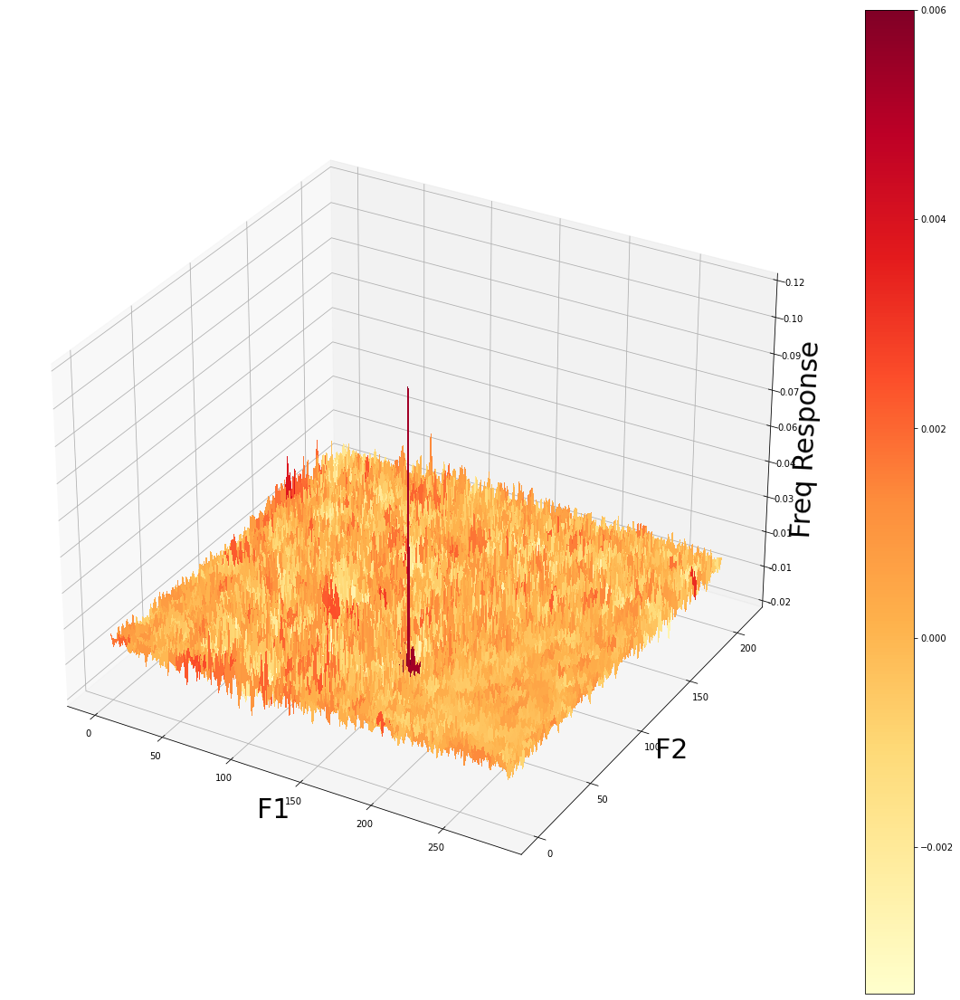

In [5]:
plt.figure(figsize=(2,3))
plt.gray()
plt.imshow(im_tm), plt.title('template', size=20), plt.axis('off')
plt.show()
fig, ax = plt.subplots(1, 2, sharey=True, figsize=(12,7))
ax[0].imshow(im), ax[0].set_title('target', size=20)
ax[1].imshow(im2), ax[1].set_title('matched template', size=20)
for a in ax.ravel():
    a.set_axis_off()
plt.tight_layout()
plt.show()
Y = np.arange(F_cc.shape[0])
X = np.arange(F_cc.shape[1])
X, Y = np.meshgrid(X, Y)
Z = c
plot_3d(X,Y,Z, cmap='YlOrRd') #PiYG

 ## 2. Image Compression with Discrete Cosine Transform (DCT)

In [11]:
from scipy.fftpack import dct, idct

def dct2(a):
    return dct(dct(a, axis=0, norm='ortho'), axis=1, norm='ortho')

def idct2(a):
    return idct(idct(a, axis=0, norm='ortho'), axis=1, norm='ortho')    

im = rgb2gray(imread('images/Chapter 04/images/Img_04_04.jpg')) 
imF = dct2(im)
im1 = idct2(imF)

print(np.allclose(im, im1))

True


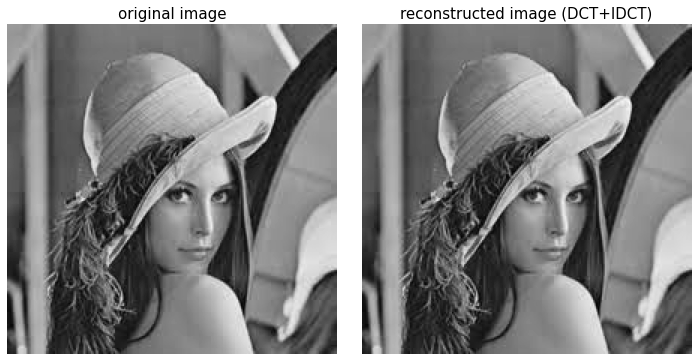

In [12]:
plt.figure(figsize=(10,5))
plt.gray()
plt.subplot(121), plt.imshow(im), plt.axis('off'), plt.title('original image', size=15)
plt.subplot(122), plt.imshow(im1), plt.axis('off'), plt.title('reconstructed image (DCT+IDCT)', size=15)
plt.tight_layout()
plt.show()

### JPEG Compression

In [17]:
im = rgb2gray(cv2.imread('images/Chapter 04/images/Img_04_05.png',cv2.IMREAD_COLOR))

dct_coeffs = np.zeros(im.shape)

for i in range(0, im.shape[0], 8):
    for j in range(0, im.shape[1], 8):
        dct_coeffs[i:(i+8),j:(j+8)] = dct2(im[i:(i+8),j:(j+8)])

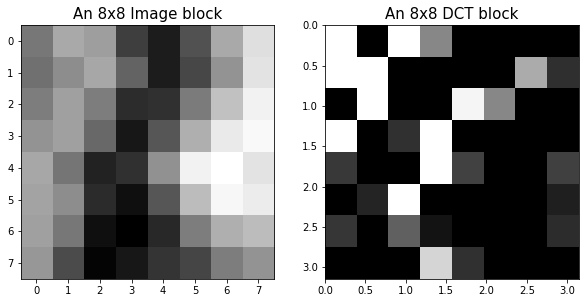

In [18]:
index = 112
plt.figure(figsize=(10,6))
plt.gray()
plt.subplot(121), plt.imshow(im[index:index+8,index:index+8]), plt.title( "An 8x8 Image block", size=15)
plt.subplot(122), plt.imshow(dct_coeffs[index:index+8,index:index+8], vmax= np.max(dct_coeffs)*0.01, vmin = 0, extent=[0, np.pi, np.pi, 0])
plt.title("An 8x8 DCT block", size=15)
plt.show()

Keeping only 5.901336669921875% of the DCT coefficients


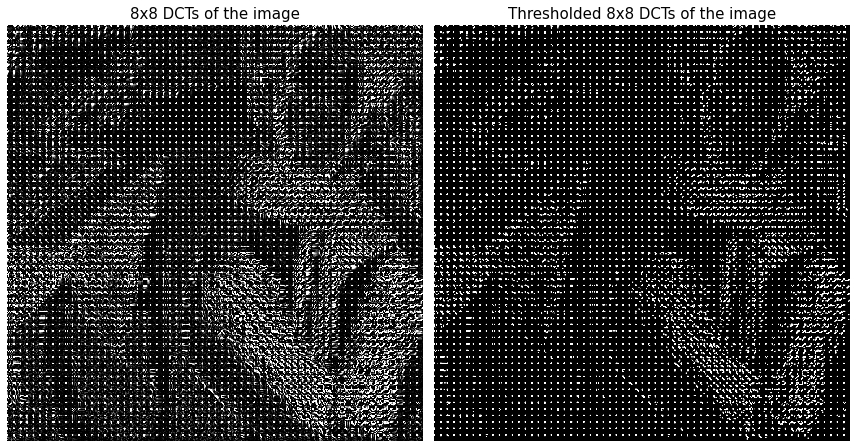

In [19]:
thresh = 0.03
dct_thresh = dct_coeffs * (abs(dct_coeffs) > (thresh*np.max(dct_coeffs)))
percent_nonzeros = np.sum( dct_thresh != 0.0 ) / (im.shape[0]*im.shape[1])
print ("Keeping only {}% of the DCT coefficients".format(percent_nonzeros*100.0))

plt.figure(figsize=(12,7))
plt.gray()
plt.subplot(121), plt.imshow(dct_coeffs,cmap='gray',vmax = np.max(dct_coeffs)*0.01,vmin = 0), plt.axis('off')
plt.title("8x8 DCTs of the image", size=15)
plt.subplot(122), plt.imshow(dct_thresh, vmax = np.max(dct_coeffs)*0.01, vmin = 0), plt.axis('off')
plt.title("Thresholded 8x8 DCTs of the image", size=15)
plt.tight_layout()
plt.show()

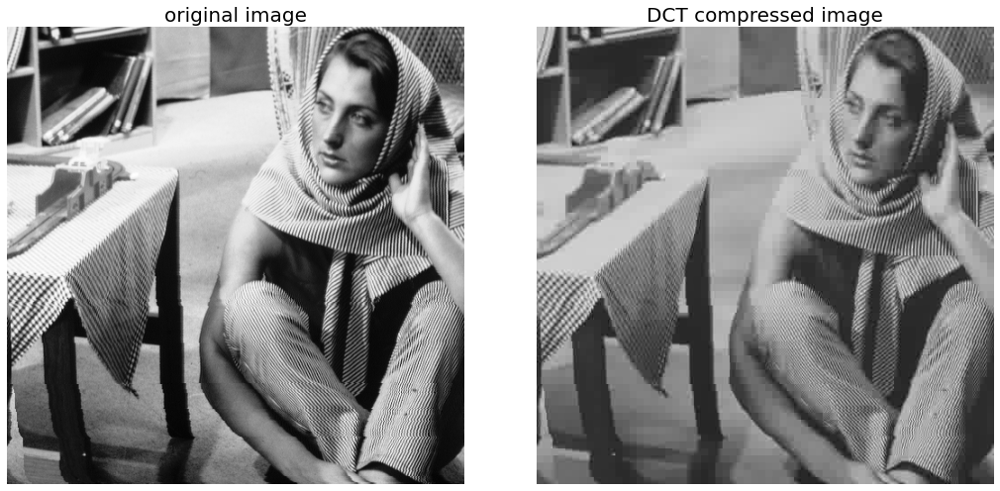

In [20]:
im_out = np.zeros(im.shape)
for i in range(0, im.shape[0], 8):
    for j in range(0, im.shape[1], 8):
        im_out[i:(i+8),j:(j+8)] = idct2( dct_thresh[i:(i+8),j:(j+8)] )

plt.figure(figsize=(15,7))
plt.gray()
plt.subplot(121), plt.imshow(im), plt.axis('off'), plt.title('original image', size=20)
plt.subplot(122), plt.imshow(im_out), plt.axis('off'), plt.title('DCT compressed image', size=20)
plt.tight_layout()
plt.show()

## 3. Image Denoising with Discrete Cosine Transform (DCT)

/var/folders/9v/jr20lh896vggl5_25dthcsw80000gn/T/ipykernel_19845/3559500284.py:9: FutureWarning: `multichannel` is a deprecated argument name for `estimate_sigma`. It will be removed in version 1.0. Please use `channel_axis` instead.
  sigma_est = np.mean(estimate_sigma(noisy, multichannel=True))


estimated noise standard deviation = 0.21623843763302517


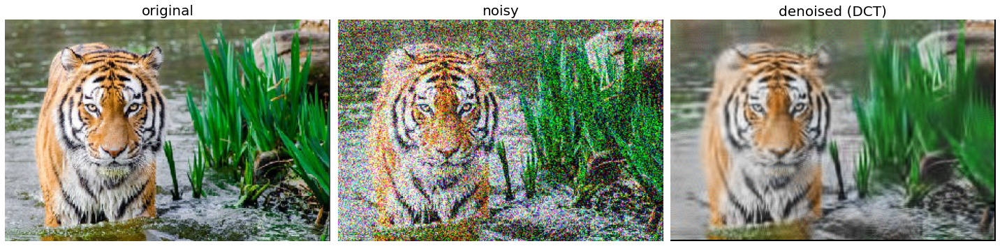

In [2]:
from skimage import img_as_float
from skimage.restoration import estimate_sigma

im = img_as_float(imread('images/Chapter 04/images/Img_04_06.jpg'))
sigma = 0.25
noisy = im + sigma * np.random.standard_normal(im.shape)
noisy = np.clip(noisy, 0, 1)

sigma_est = np.mean(estimate_sigma(noisy, multichannel=True))
print("estimated noise standard deviation = {}".format(sigma_est))

out = noisy.copy()
cv2.xphoto.dctDenoising(noisy, out, sigma_est)
out = np.clip(out, 0, 1)

plt.figure(figsize=(20,10))
plt.subplot(131), plt.imshow(im), plt.axis('off'), plt.title('original', size=20)
plt.subplot(132), plt.imshow(noisy), plt.axis('off'), plt.title('noisy', size=20)
plt.subplot(133), plt.imshow(out), plt.axis('off'), plt.title('denoised (DCT)', size=20)
plt.tight_layout()
plt.show()

## 4. Deconvolution for Image Deblurring

In [2]:
import SimpleITK as sitk
from skimage import restoration
from skimage.metrics import peak_signal_noise_ratio

### 4.1 Blur Detection

In [3]:
from scipy.signal import convolve2d

def convolve(im, kernel):
    im1 = convolve2d(im, kernel, mode='same')
    return im1 / np.max(im1)

def check_if_blurry(image, threshold):
    # compute the Laplacian of the image and then return the focus
    # measure, which is simply the variance of the Laplacian
    var = cv2.Laplacian(image, cv2.CV_64F).var()
    return 'Var Laplacian = {}\n{}'.format(round(var, 6), 'Blurry' if var < threshold else 'Not Blurry')

def plot_blurry(im, title):
    plt.imshow(im), plt.axis('off'), plt.title(title, size=20)

def get_gaussian_edge_blur_kernel(sigma, sz=15):
    # First create a 1-D Gaussian kernel
    x = np.linspace(-10, 10, sz)
    kernel_1d = np.exp(-x**2/sigma**2)
    kernel_1d /= np.trapz(kernel_1d) # normalize the sum to 1.0
    # create a 2-D Gaussian kernel from the 1-D kernel
    kernel_2d = kernel_1d[:, np.newaxis] * kernel_1d[np.newaxis, :]
    return kernel_2d

In [4]:
threshold = 0.01
imlist = []

im = rgb2gray(imread('images/Chapter 04/images/Img_04_06.jpg'))
imlist.append((im, 'original image\n' + check_if_blurry(im, threshold)))

kernel = get_gaussian_edge_blur_kernel(3)
im1 = convolve(im, kernel)
imlist.append((im1, '(edge) blurred image\n' + check_if_blurry(im1, threshold)))

In [5]:
def get_motion_blur_kernel(ln, angle, sz=15):
    kern = np.ones((1, ln), np.float32)
    angle = -np.pi*angle/180
    c, s = np.cos(angle), np.sin(angle)
    A = np.float32([[c, -s, 0], [s, c, 0]])
    sz2 = sz // 2
    A[:,2] = (sz2, sz2) - np.dot(A[:,:2], ((ln-1)*0.5, 0))
    kern = cv2.warpAffine(kern, A, (sz, sz), flags=cv2.INTER_CUBIC)
    return kern

kernel = get_motion_blur_kernel(9, 45)
im1 = convolve(im, kernel)
imlist.append((im1, '(motion) blurred image\n' + check_if_blurry(im1, threshold)))

def get_out_of_focus_kernel(r, sz=15):
    kern = np.zeros((sz, sz), np.uint8)
    cv2.circle(kern, (sz, sz), r, 255, -1, cv2.LINE_AA, shift=1)
    kern = np.float32(kern) / 255
    return kern

kernel = get_out_of_focus_kernel(7)
im1 = convolve(im, kernel)
imlist.append((im1, '(out-of-focus) blurred image\n' + check_if_blurry(im1, threshold)))

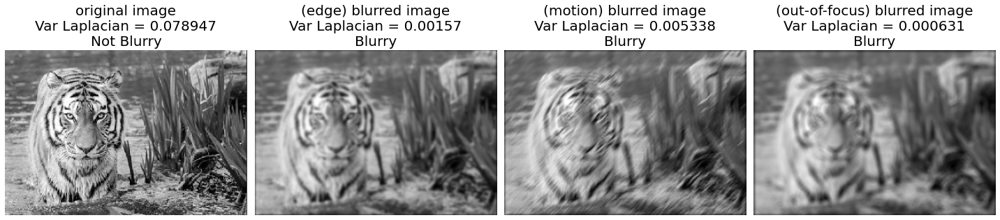

In [6]:
plt.figure(figsize=(20,7))
plt.gray()
for i in range(len(imlist)):
    im, title = imlist[i]
    plt.subplot(1,4,i+1), plot_blurry(im, title)
plt.tight_layout()
plt.show()

### 4.2 Non-blind Deblurring with SimpleITK deconvolution filters

In [9]:
import SimpleITK as sitk
from scipy import signal
# im = rgb2gray(imread('images/Chapter 04/images/img_04_07.png'))
im = rgb2gray(cv2.imread('images/Chapter 04/images/Img_04_07.png',cv2.IMREAD_COLOR))

psf = get_out_of_focus_kernel(7, 9).astype(np.float) 
im_blur = signal.convolve2d(im, psf, 'same')
im_blur = im_blur / np.max(im_blur)

tkfilter = sitk.InverseDeconvolutionImageFilter()
tkfilter.SetNormalize(True)
im_res_IN = sitk.GetArrayFromImage(tkfilter.Execute (sitk.GetImageFromArray(im_blur), sitk.GetImageFromArray(psf)))

tkfilter = sitk.WienerDeconvolutionImageFilter()
tkfilter.SetNoiseVariance(0)
tkfilter.SetNormalize(True)
im_res_WN = sitk.GetArrayFromImage(tkfilter.Execute (sitk.GetImageFromArray(im_blur), sitk.GetImageFromArray(psf)))

tkfilter = sitk.TikhonovDeconvolutionImageFilter() 
tkfilter.SetRegularizationConstant(0.008) #0.06)
tkfilter.SetNormalize(True)
im_res_TK = sitk.GetArrayFromImage(tkfilter.Execute (sitk.GetImageFromArray(im_blur), sitk.GetImageFromArray(psf)))

tkfilter = sitk.RichardsonLucyDeconvolutionImageFilter() 
tkfilter.SetNumberOfIterations(100)
tkfilter.SetNormalize(True)
im_res_RL = sitk.GetArrayFromImage(tkfilter.Execute (sitk.GetImageFromArray(im_blur), sitk.GetImageFromArray(psf)))

/var/folders/9v/jr20lh896vggl5_25dthcsw80000gn/T/ipykernel_20050/1120725475.py:6: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  psf = get_out_of_focus_kernel(7, 9).astype(np.float)


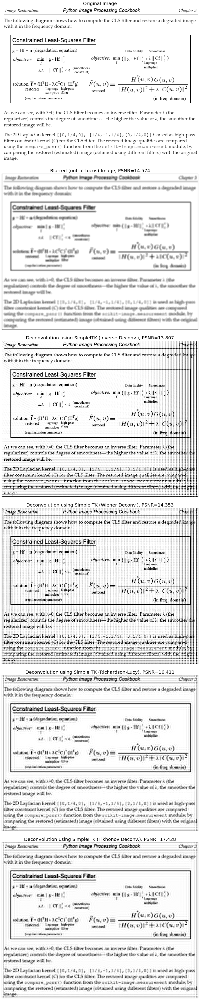

In [10]:
plt.figure(figsize=(20, 60))
plt.subplots_adjust(0,0,1,1,0.07,0.07)
plt.gray()

plt.subplot(611), plt.imshow(im), plt.axis('off'), plt.title('Original Image', size=20)
plt.subplot(612), plt.imshow(im_blur), plt.axis('off'), plt.title('Blurred (out-of-focus) Image, PSNR={:.3f}'.format(peak_signal_noise_ratio(im, im_blur)), size=20)
plt.subplot(613), plt.imshow(im_res_IN, vmin=im_blur.min(), vmax=im_blur.max()), plt.axis('off') 
plt.title('Deconvolution using SimpleITK (Inverse Deconv.), PSNR={:.3f}'.format(peak_signal_noise_ratio(im, im_res_IN)), size=20)
plt.subplot(614), plt.imshow(im_res_WN, vmin=im_blur.min(), vmax=im_blur.max()), plt.axis('off') 
plt.title('Deconvolution using SimpleITK (Wiener Deconv.), PSNR={:.3f}'.format(peak_signal_noise_ratio(im, im_res_WN)), size=20)
plt.subplot(615), plt.imshow(im_res_RL, vmin=im_blur.min(), vmax=im_blur.max()), plt.axis('off')
plt.title('Deconvolution using SimpleITK (Richardson-Lucy), PSNR={:.3f}'.format(peak_signal_noise_ratio(im, im_res_RL)), size=20)
plt.subplot(616), plt.imshow(im_res_TK, vmin=im_blur.min(), vmax=im_blur.max()), plt.axis('off')
plt.title('Deconvolution using SimpleITK (Tikhonov Deconv.), PSNR={:.3f}'.format(peak_signal_noise_ratio(im, im_res_TK)), size=20)

plt.show()

### 4.3 Non-blind Deblurring with scikit-image restoration module functions

/var/folders/9v/jr20lh896vggl5_25dthcsw80000gn/T/ipykernel_20050/263868633.py:3: FutureWarning: `iterations` is a deprecated argument name for `richardson_lucy`. It will be removed in version 1.0. Please use `num_iter` instead.
  im_res_RL = restoration.richardson_lucy(im_blur, psf, iterations=20)


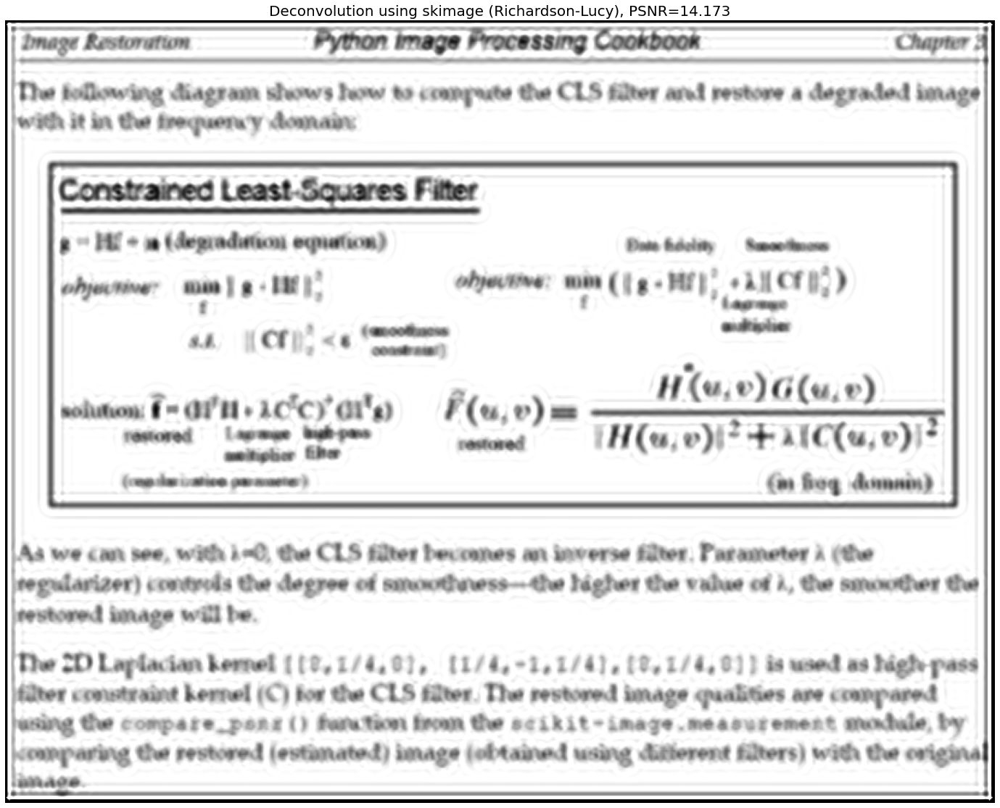

In [11]:
from skimage import restoration

im_res_RL = restoration.richardson_lucy(im_blur, psf, iterations=20)

plt.figure(figsize=(20, 15))
plt.subplots_adjust(0,0,1,1,0.07,0.07)
plt.gray()
plt.imshow(im_res_RL, vmin=im_blur.min(), vmax=im_blur.max()), plt.axis('off')
plt.title('Deconvolution using skimage (Richardson-Lucy), PSNR={:.3f}'.format(peak_signal_noise_ratio(im, im_res_RL)), size=20)
plt.show()

## 5. Image Denoising with Wavelets

In [12]:
import numpy as np
import pywt
from pywt._doc_utils import wavedec2_keys, draw_2d_wp_basis
from skimage.filters import threshold_otsu
from skimage import img_as_float
import matplotlib.pylab as plt

### 5.0 Wavelet Basics 

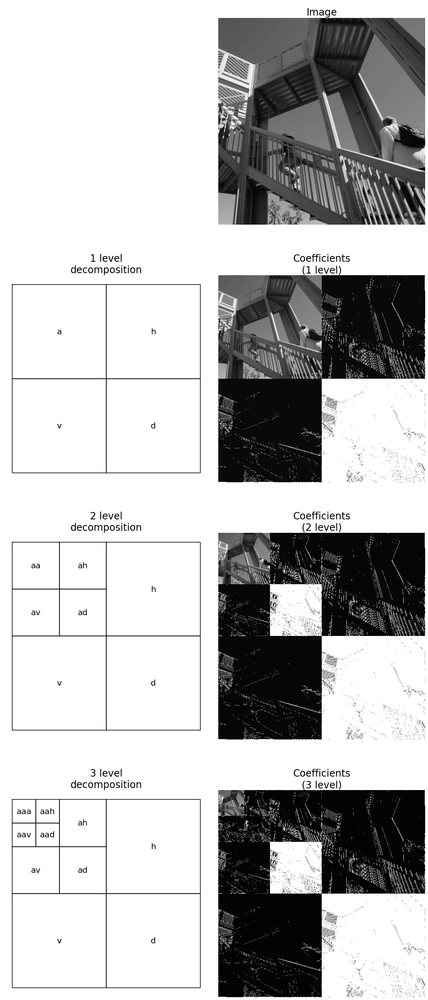

In [13]:
x = pywt.data.ascent().astype(np.float32)
shape = x.shape

plt.rcParams.update({'font.size': 20})

max_lev = 3       # how many levels of decomposition to draw
label_levels = 3  # how many levels to explicitly label on the plots

fig, axes = plt.subplots(4, 2, figsize=[15, 35])
plt.subplots_adjust(0, 0, 1, 0.95, 0.05, 0.05)
for level in range(0, max_lev + 1):
    if level == 0:
        # show the original image before decomposition
        axes[0, 0].set_axis_off()
        axes[0, 1].imshow(x, cmap=plt.cm.gray)
        axes[0, 1].set_title('Image')
        axes[0, 1].set_axis_off()
        continue

    # plot subband boundaries of a standard DWT basis
    draw_2d_wp_basis(shape, wavedec2_keys(level), ax=axes[level, 0],
                     label_levels=label_levels)
    axes[level, 0].set_title('{} level\ndecomposition'.format(level))

    # compute the 2D DWT
    c = pywt.wavedec2(x, 'db2', mode='periodization', level=level)
    # normalize each coefficient array independently for better visibility
    c[0] /= np.abs(c[0]).max()
    for detail_level in range(level):
        c[detail_level + 1] = [d/np.abs(d).max() > threshold_otsu(d/np.abs(d).max()) for d in c[detail_level + 1]]
    # show the normalized coefficients
    arr, slices = pywt.coeffs_to_array(c)
    axes[level, 1].imshow(arr, cmap=plt.cm.gray)
    axes[level, 1].set_title('Coefficients\n({} level)'.format(level))
    axes[level, 1].set_axis_off()

plt.tight_layout()
plt.show()

 ### 5.1 Image Denoising using Wavelets with pywt

7
['bior1.1', 'bior1.3', 'bior1.5', 'bior2.2', 'bior2.4', 'bior2.6', 'bior2.8', 'bior3.1', 'bior3.3', 'bior3.5', 'bior3.7', 'bior3.9', 'bior4.4', 'bior5.5', 'bior6.8', 'coif1', 'coif2', 'coif3', 'coif4', 'coif5', 'coif6', 'coif7', 'coif8', 'coif9', 'coif10', 'coif11', 'coif12', 'coif13', 'coif14', 'coif15', 'coif16', 'coif17', 'db1', 'db2', 'db3', 'db4', 'db5', 'db6', 'db7', 'db8', 'db9', 'db10', 'db11', 'db12', 'db13', 'db14', 'db15', 'db16', 'db17', 'db18', 'db19', 'db20', 'db21', 'db22', 'db23', 'db24', 'db25', 'db26', 'db27', 'db28', 'db29', 'db30', 'db31', 'db32', 'db33', 'db34', 'db35', 'db36', 'db37', 'db38', 'dmey', 'haar', 'rbio1.1', 'rbio1.3', 'rbio1.5', 'rbio2.2', 'rbio2.4', 'rbio2.6', 'rbio2.8', 'rbio3.1', 'rbio3.3', 'rbio3.5', 'rbio3.7', 'rbio3.9', 'rbio4.4', 'rbio5.5', 'rbio6.8', 'sym2', 'sym3', 'sym4', 'sym5', 'sym6', 'sym7', 'sym8', 'sym9', 'sym10', 'sym11', 'sym12', 'sym13', 'sym14', 'sym15', 'sym16', 'sym17', 'sym18', 'sym19', 'sym20']


/Users/yh/opt/anaconda3/envs/Image/lib/python3.8/site-packages/pywt/_multilevel.py:43: UserWarning: Level value of 7 is too high: all coefficients will experience boundary effects.
  warnings.warn(


7


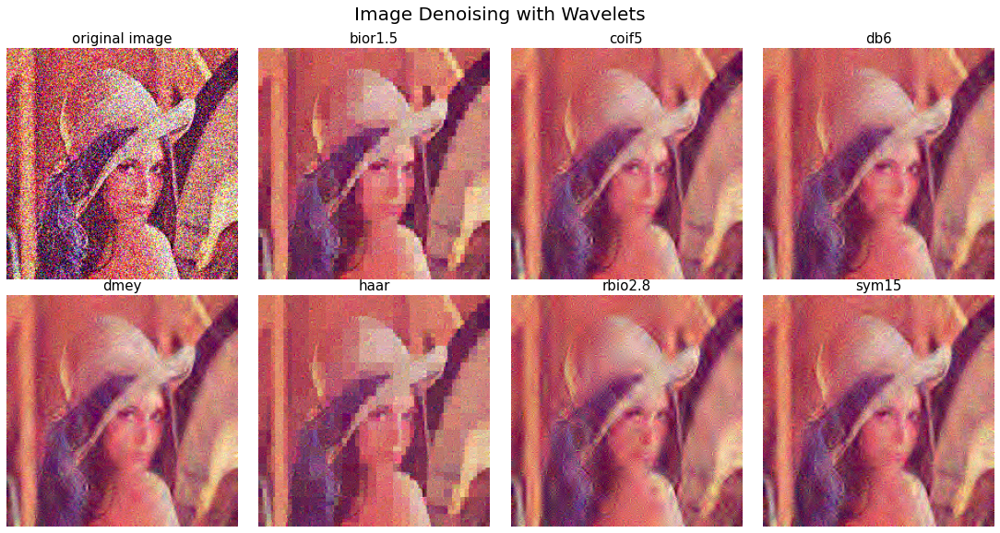

In [16]:
image = img_as_float(imread('images/Chapter 04/images/Img_04_04.jpg')) 
noise_sigma = 0.25 #16.0
image += np.random.normal(0, noise_sigma, size=image.shape)

wavelet = pywt.Wavelet('haar')
levels  = int(np.floor(np.log2(image.shape[0])))
print(levels)
wavelet_coeffs = pywt.wavedec2(image, wavelet, level=levels)

def denoise(image, wavelet, noise_sigma):
    levels = int(np.floor(np.log2(image.shape[0])))
    wc = pywt.wavedec2(image, wavelet, level=levels)
    arr, coeff_slices = pywt.coeffs_to_array(wc)
    arr = pywt.threshold(arr, noise_sigma, mode='soft')
    nwc = pywt.array_to_coeffs(arr, coeff_slices, output_format='wavedec2')
    return pywt.waverec2(nwc, wavelet)

print(pywt.wavelist(kind='discrete'))
wlts = ['bior1.5', 'coif5', 'db6', 'dmey', 'haar', 'rbio2.8', 'sym15'] # pywt.wavelist(kind='discrete')
Denoised={}
for wlt in wlts:
    out = image.copy()
    for i in range(3):
        out[...,i] = denoise(image[...,i], wavelet=wlt, noise_sigma=3/2*noise_sigma)
    Denoised[wlt] = np.clip(out, 0, 1)
print(len(Denoised))

plt.figure(figsize=(15,8))
plt.subplots_adjust(0,0,1,0.9,0.05,0.07)
plt.subplot(241), plt.imshow(np.clip(image,0,1)), plt.axis('off'), plt.title('original image', size=15)
i = 2
for wlt in Denoised:
    plt.subplot(2,4,i), plt.imshow(Denoised[wlt]), plt.axis('off'), plt.title(wlt, size=15)
    i += 1
plt.suptitle('Image Denoising with Wavelets', size=20)
plt.show()

### 5.2 Image Denoising with Wavelets using scikit-image restoration

In [17]:
from skimage.restoration import (denoise_wavelet, estimate_sigma)
from skimage import data, img_as_float
from skimage.util import random_noise
from skimage.metrics import peak_signal_noise_ratio

original = img_as_float(imread('images/Chapter 04/images/Img_04_08.png'))[...,:3]
sigma = 0.12
noisy = random_noise(original, var=sigma**2)

sigma_est = estimate_sigma(noisy, multichannel=True, average_sigmas=True)
print(f"Estimated Gaussian noise standard deviation = {sigma_est}")

im_bayes = denoise_wavelet(noisy, multichannel=True, convert2ycbcr=True,
                           method='BayesShrink', mode='soft',
                           rescale_sigma=True)
im_visushrink = denoise_wavelet(noisy, multichannel=True, convert2ycbcr=True,
                                method='VisuShrink', mode='soft',
                                sigma=sigma_est, rescale_sigma=True)

im_visushrink2 = denoise_wavelet(noisy, multichannel=True, convert2ycbcr=True,
                                 method='VisuShrink', mode='soft',
                                 sigma=sigma_est/2, rescale_sigma=True)
im_visushrink4 = denoise_wavelet(noisy, multichannel=True, convert2ycbcr=True,
                                 method='VisuShrink', mode='soft',
                                 sigma=sigma_est/4, rescale_sigma=True)

psnr_noisy = peak_signal_noise_ratio(original, noisy)
psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
psnr_visushrink4 = peak_signal_noise_ratio(original, im_visushrink4)

/var/folders/9v/jr20lh896vggl5_25dthcsw80000gn/T/ipykernel_20050/592814629.py:10: FutureWarning: `multichannel` is a deprecated argument name for `estimate_sigma`. It will be removed in version 1.0. Please use `channel_axis` instead.
  sigma_est = estimate_sigma(noisy, multichannel=True, average_sigmas=True)
/var/folders/9v/jr20lh896vggl5_25dthcsw80000gn/T/ipykernel_20050/592814629.py:13: FutureWarning: `multichannel` is a deprecated argument name for `denoise_wavelet`. It will be removed in version 1.0. Please use `channel_axis` instead.
  im_bayes = denoise_wavelet(noisy, multichannel=True, convert2ycbcr=True,
/var/folders/9v/jr20lh896vggl5_25dthcsw80000gn/T/ipykernel_20050/592814629.py:16: FutureWarning: `multichannel` is a deprecated argument name for `denoise_wavelet`. It will be removed in version 1.0. Please use `channel_axis` instead.
  im_visushrink = denoise_wavelet(noisy, multichannel=True, convert2ycbcr=True,


Estimated Gaussian noise standard deviation = 0.1180353392742569


/var/folders/9v/jr20lh896vggl5_25dthcsw80000gn/T/ipykernel_20050/592814629.py:20: FutureWarning: `multichannel` is a deprecated argument name for `denoise_wavelet`. It will be removed in version 1.0. Please use `channel_axis` instead.
  im_visushrink2 = denoise_wavelet(noisy, multichannel=True, convert2ycbcr=True,
/var/folders/9v/jr20lh896vggl5_25dthcsw80000gn/T/ipykernel_20050/592814629.py:23: FutureWarning: `multichannel` is a deprecated argument name for `denoise_wavelet`. It will be removed in version 1.0. Please use `channel_axis` instead.
  im_visushrink4 = denoise_wavelet(noisy, multichannel=True, convert2ycbcr=True,


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


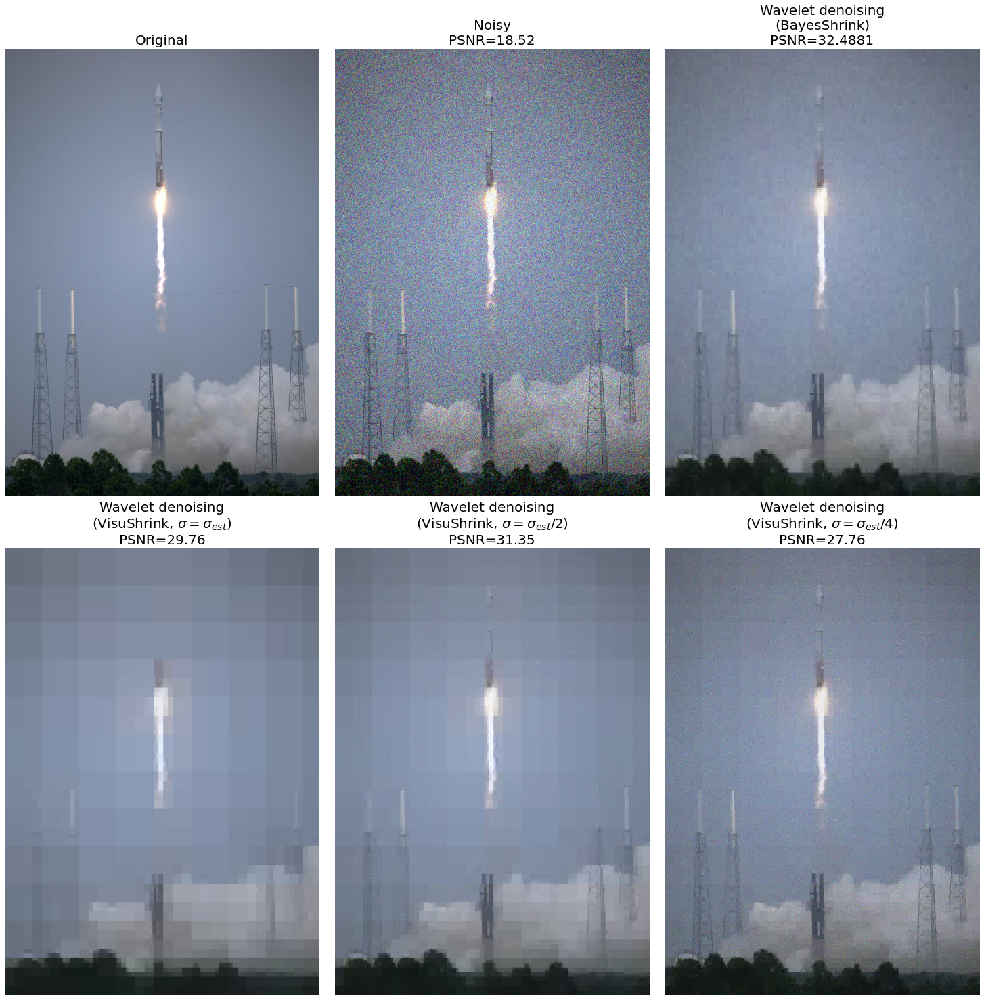

In [18]:
plt.figure(figsize=(20,20))
plt.subplots_adjust(0,0,1,1,0.05,0.05)
plt.subplot(231), plt.imshow(original), plt.axis('off'), plt.title('Original', size=20)
plt.subplot(232), plt.imshow(noisy), plt.axis('off'), plt.title('Noisy\nPSNR={:0.4g}'.format(psnr_noisy), size=20)
plt.subplot(233), plt.imshow(im_bayes/im_bayes.max()), plt.axis('off'), plt.title('Wavelet denoising\n(BayesShrink)\nPSNR={:0.4f}'.format(psnr_bayes), size=20)
plt.subplot(234), plt.imshow(im_visushrink/im_visushrink.max()), plt.axis('off')
plt.title('Wavelet denoising\n' + r'(VisuShrink, $\sigma=\sigma_{est}$)' + '\nPSNR={:0.4g}'.format(psnr_visushrink), size=20)
plt.subplot(235), plt.imshow(im_visushrink2/im_visushrink2.max()), plt.axis('off')
plt.title('Wavelet denoising\n' + r'(VisuShrink, $\sigma=\sigma_{est}/2$)' + '\nPSNR={:0.4g}'.format(psnr_visushrink2), size=20)
plt.subplot(236), plt.imshow(im_visushrink4/im_visushrink4.max()), plt.axis('off')
plt.title('Wavelet denoising\n' + r'(VisuShrink, $\sigma=\sigma_{est}/4$)' + '\nPSNR={:0.4g}'.format(psnr_visushrink4), size=20)
plt.show()

## 6. Image Fusion with Wavelets

In [20]:
import pywt
import cv2
import numpy as np

def fuseCoeff(cooef1, cooef2, method):

    if (method == 'mean'):
        cooef = (cooef1 + cooef2) / 2
    elif (method == 'min'):
        cooef = np.minimum(cooef1,cooef2)
    elif (method == 'max'):
        cooef = np.maximum(cooef1,cooef2)
    else:
        cooef = []

    return cooef

fusion_method = 'mean' 

im1 = cv2.imread('images/Chapter 04/images/Img_04_10.jpg',0)
im2 = cv2.imread('images/Chapter 04/images/Img_04_11.jpg',0)

im2 = cv2.resize(im2,(im1.shape[1], im1.shape[0])) # I do this just because i used two random images

### The Fusion algorithm 

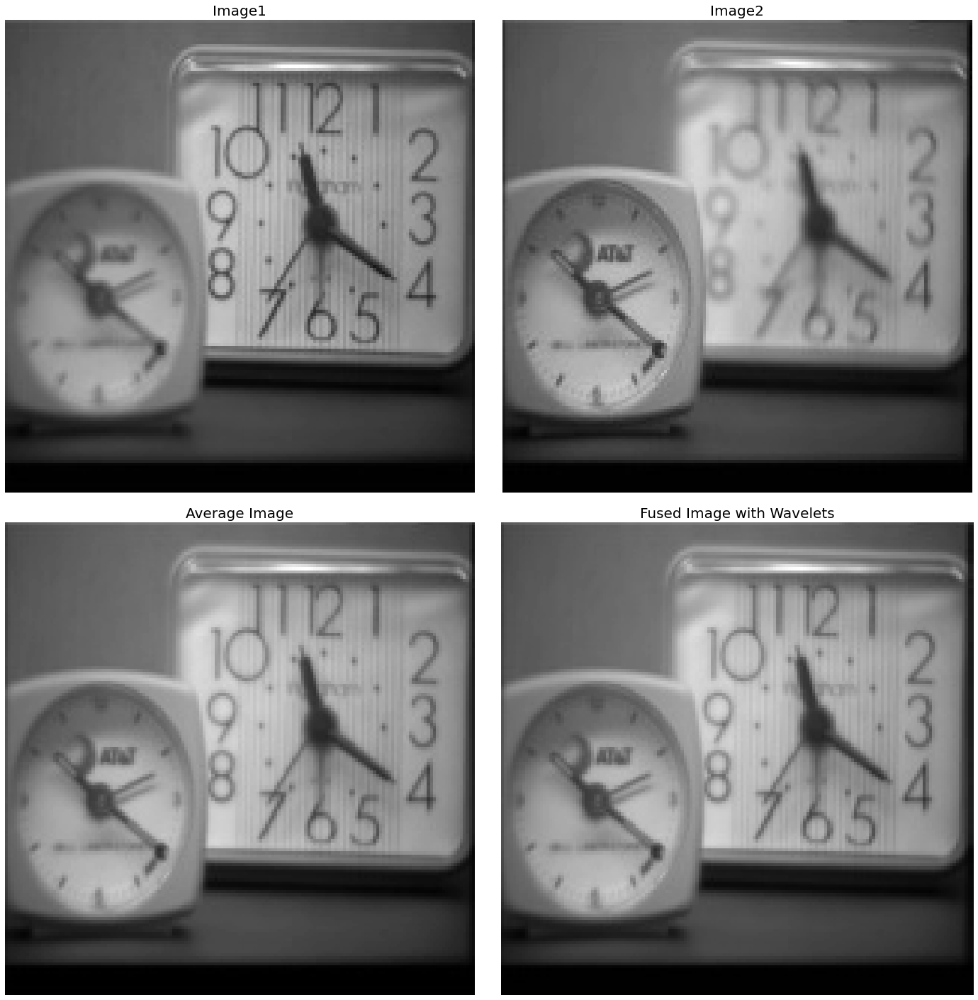

In [21]:
wavelet = 'sym2' #'bior1.1' #'haar' #'db1'
cooef1 = pywt.wavedec2(im1[:,:], wavelet)
cooef2 = pywt.wavedec2(im2[:,:], wavelet)
#print(cooef1[0].shape, len(cooef1))

fused_cooef = []
for i in range(len(cooef1)):
    # The first values in each decomposition is the apprximation values of the top level
    if(i == 0):
        fused_cooef.append(fuseCoeff(cooef1[0], cooef2[0], fusion_method))
    else:
        # For the rest of the levels we have tupels with 3 coeeficents
        c1 = fuseCoeff(cooef1[i][0], cooef2[i][0],fusion_method)
        c2 = fuseCoeff(cooef1[i][1], cooef2[i][1], fusion_method)
        c3 = fuseCoeff(cooef1[i][2], cooef2[i][2], fusion_method)
        fused_cooef.append((c1,c2,c3))

#print(len(fused_cooef))
fused_image = pywt.waverec2(fused_cooef, wavelet)

#fused_image = np.multiply(np.divide(fused_image - np.min(fused_image),(np.max(fused_image) - np.min(fused_image))),255)
fused_image = 255*fused_image / np.max(fused_image)
fused_image = fused_image.astype(np.uint8)

#print(fused_image.shape)
plt.figure(figsize=(20,20))
plt.subplot(221), plt.imshow(im1), plt.axis('off'), plt.title('Image1', size=20) #cv2.cvtColor(fused_image,cv2.COLOR_BGR2RGB))
plt.subplot(222), plt.imshow(im2), plt.axis('off'), plt.title('Image2', size=20) #cv2.cvtColor(fused_image,cv2.COLOR_BGR2RGB))
#print(np.max(im1), np.max(im2))
plt.subplot(223), plt.imshow(im1//2 + im2// 2), plt.axis('off'), plt.title('Average Image', size=20) #cv2.cvtColor(fused_image,cv2.COLOR_BGR2RGB))

plt.subplot(224), plt.imshow(fused_image), plt.axis('off'), plt.title('Fused Image with Wavelets', size=20) #cv2.cvtColor(fused_image,cv2.COLOR_BGR2RGB))
plt.tight_layout()
plt.show()

## 7. Secure Spread Spectrum Digital Watermarking with DCT

In [22]:
from scipy.fftpack import dct, idct
from skimage.io import imread
from skimage.color import rgb2gray
import numpy as np
import matplotlib.pylab as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

def dct2(a):
    return dct(dct(a.T, norm='ortho').T, norm='ortho')

def idct2(a):
    return idct(idct(a.T, norm='ortho').T, norm='ortho')    

def embed(im, k, alpha):
    m, n = im.shape
    d = dct2(im)
    indices = np.dstack(np.unravel_index(np.argsort(d.ravel()), (m, n)))[0]
    indices = indices[-(k+1):-1]
    cw = d[indices[:,0], indices[:,1]]
    w = np.random.randn(k)
    #w = w / np.linalg.norm(w)
    ci = cw * (1 + alpha * w)
    d[indices[:,0], indices[:,1]] = ci
    im1 = idct2(d)
    return im1, indices, cw, w

def detect(test, indices, cw, w, alpha):
    d = dct2(test)
    testc = d[indices[:,0], indices[:,1]]
    what = (testc/cw - 1) / alpha
    gamma = what@w/(np.linalg.norm(what)) #*np.linalg.norm(w))
    return gamma

mean difference=3.0121671985954714, max difference=12.534543824200881
detected similarity=31.315998552163496


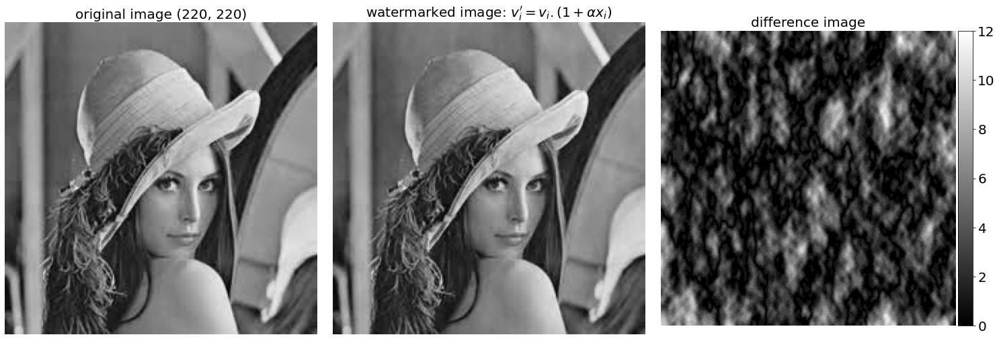

In [23]:
k = 1000
alpha = 0.1
im = rgb2gray(imread('images/Chapter 04/images/Img_04_04.jpg'))
im = (255*im).astype(np.uint8)
im1, indices, cw, w = embed(im, k=k, alpha=alpha)
print('mean difference={}, max difference={}'.format(np.mean(np.abs(im1-im)), np.max(np.abs(im1-im))))
similarity = detect(im1, indices, cw, w, alpha)
print('detected similarity={}'.format(similarity))

fig = plt.figure(figsize=(20,10))
plt.gray()
plt.subplots_adjust(0,0,1,0.925,0.05,0.05)
plt.subplot(131), plt.imshow(im), plt.axis('off'), plt.title('original image {}'.format(im.shape), size=20)
plt.subplot(132), plt.imshow(im1), plt.axis('off'), plt.title(r'watermarked image: $v_i^{\prime}=v_i.(1+\alpha x_i)$', size=20)
plt.subplot(133)
last_axes = plt.gca()
img = plt.imshow((np.abs(im1-im)).astype(np.uint8))
divider = make_axes_locatable(img.axes)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(img, cax=cax)
plt.sca(last_axes)
plt.axis('off'), plt.title('difference image', size=20)
plt.show()